In [1]:
%matplotlib inline
# from sklearn.ensemble import RandomForestClassifier
# import optuna
import xgboost as xgb
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


np.random.seed(0)
from astropy.table import Table
from astropy.io import fits

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn import metrics
from sklearn.metrics import (
    f1_score, 
    accuracy_score, 
    precision_score,
    recall_score,
    matthews_corrcoef,
    )

import json

# Construct Test Dataset

In [2]:
df_test = pd.read_csv('/cargo/public/catdata/gps-ps1-cat-goodph/qphSelCol_hgps-ps1-cat-0000.csv')

In [3]:
df_test.columns

Index(['ra', 'dec', 'l', 'b', 'gps_pstar', 'gps_pgalaxy', 'gps_pnoise',
       'gps_psaturated', 'g', 'r', 'i', 'z', 'y', 'e_g', 'e_r', 'e_i', 'e_z',
       'e_y', 'jap', 'hap', 'kap', 'e_jap', 'e_hap', 'e_kap', 'cat_pmra',
       'cat_pmdec', 'cat_sigpmra', 'cat_sigpmdec', 'w1vega', 'w2vega', 'e_w1',
       'e_w2', 'cat_w1snr_pm', 'cat_w2snr_pm', 'cat_rchi2', 'cat_nb', 'cat_na',
       'cat_w1sat', 'cat_w2sat', 'w1ab', 'w2ab', 'jab', 'hab', 'kab', 'iz',
       'zy', 'yj', 'jh', 'hk', 'iw1', 'zw1', 'yw1', 'jw1', 'hw1', 'kw1',
       'w1w2', 'ebv', 'n64pix'],
      dtype='object')

In [4]:
import copy
df_gpq_test = df_test.copy()

In [5]:
df_gpq_test.shape

(291226, 58)

# Prediction Test

In [ ]:
## look up color-color diagram to decide on the clasffication criterion
## sklearn predict method: 50% criterion
## can change the criterion by limiting the predict_proba

In [6]:
import seaborn as sns

plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams["figure.figsize"] = (5,3) # 调整图片尺寸
plt.rcParams["figure.dpi"] = 180  # 提高图片分辨率

## 1. extragal vs star

In [7]:
features = ['iz','zy','yj','jh','hk','iw1','zw1','yw1','jw1','hw1','kw1','w1w2']

X1 = df_gpq_test[features].values

In [8]:
X1.shape

(291226, 12)

In [9]:
clf1 = pickle.load(open('clf1-test5.pkl', 'rb'))
clf2 = pickle.load(open('clf2-test5.pkl', 'rb'))

###### about label 0/1 #######
# clf1 -- extragal:0, star:1
# clf2 -- galaxy:0, qso:1

In [10]:
clf1.predict(X1)

array([0, 1, 0, ..., 0, 0, 0])

In [11]:
clf1.predict_proba(X1)

array([[9.9493170e-01, 5.0682751e-03],
       [9.4325900e-02, 9.0567410e-01],
       [6.5153378e-01, 3.4846622e-01],
       ...,
       [9.9979007e-01, 2.0992212e-04],
       [6.3687909e-01, 3.6312088e-01],
       [8.4212661e-01, 1.5787338e-01]], dtype=float32)

In [12]:
clf1.predict_proba(X1).T[1]

array([5.0682751e-03, 9.0567410e-01, 3.4846622e-01, ..., 2.0992212e-04,
       3.6312088e-01, 1.5787338e-01], dtype=float32)

In [13]:
np.where(clf1.predict_proba(X1).T[0]>0.95)

(array([     0,      6,     14, ..., 291220, 291221, 291223]),)

### i) test with 50% criterion

In [33]:
df_gpq_test['Pred_class_1_50'] = clf1.predict(X1)

In [34]:
df_gpq_test.loc[df_gpq_test.Pred_class_1_50==0]

,level_1,gps_ra,gps_dec,l,b,gp,rp,ip,zp,yp,...,jh,hk,iw1,zw1,yw1,jw1,hw1,kw1,w1w2,Pred_class_1_50
0,1,277.989194,-13.692333,18.547393,-1.978376,21.1271,19.8247,19.3117,18.6135,18.9322,...,0.486776,-0.073596,4.5077,3.8095,4.1282,4.157000,3.670224,3.743820,-0.775,0
2,3,277.988660,-13.692189,18.547281,-1.977849,21.1271,19.8247,19.3117,18.6135,18.9322,...,0.140833,-0.324666,4.5077,3.8095,4.1282,3.039207,2.898374,3.223040,-0.775,0
6,7,277.987829,-13.714007,18.527538,-1.987195,NaN,22.5994,20.4807,19.4969,20.2769,...,0.330375,-0.351601,4.5017,3.5179,4.2979,2.370050,2.039675,2.391276,-0.771,0
15,18,277.987855,-13.788220,18.461658,-2.021441,21.3552,19.9951,19.3626,18.9777,19.4608,...,0.274487,-0.419911,3.0036,2.6187,3.1018,2.107475,1.832988,2.252899,-1.049,0
28,40,277.989055,-13.812215,18.440891,-2.033540,NaN,23.0495,20.2187,19.1430,19.4732,...,0.273358,-0.293183,3.7087,2.6330,2.9632,1.791379,1.518021,1.811204,-0.660,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
537672,849992,294.645434,22.963594,58.590406,0.602808,24.5060,23.0958,21.4231,20.4853,20.0638,...,0.553412,-0.214136,4.2441,3.3063,2.8848,2.078773,1.525361,1.739497,-0.915,0
537674,849994,294.626515,22.963676,58.581928,0.618026,23.6961,21.7809,20.9381,20.0924,19.7733,...,0.394055,0.375028,3.5631,2.7174,2.3983,1.631848,1.237793,0.862765,-0.522,0
537675,849996,294.608750,22.963842,58.574046,0.632361,25.6742,23.4138,22.0968,21.3429,20.9922,...,2.018554,0.832525,5.0148,4.2609,3.9102,3.858811,1.840257,1.007732,-1.053,0
537676,849997,294.639300,22.963485,58.587538,0.607675,20.6482,19.1625,18.2717,17.7685,17.4032,...,1.090704,0.397149,1.6697,1.1665,0.8012,1.615873,0.525169,0.128020,-0.862,0


In [35]:
df_gpq_test.Pred_class_1_50.value_counts()

# 349185 stars, 188493 extragal

1    349185
0    188493
Name: Pred_class_1_50, dtype: int64

In [36]:
df_gpq_test_extragal = df_gpq_test[df_gpq_test.Pred_class_1_50==0]
df_gpq_test_star = df_gpq_test[df_gpq_test.Pred_class_1_50==1]

Text(0.5, 1.0, 'w1w2 - yw1 -- 50%')

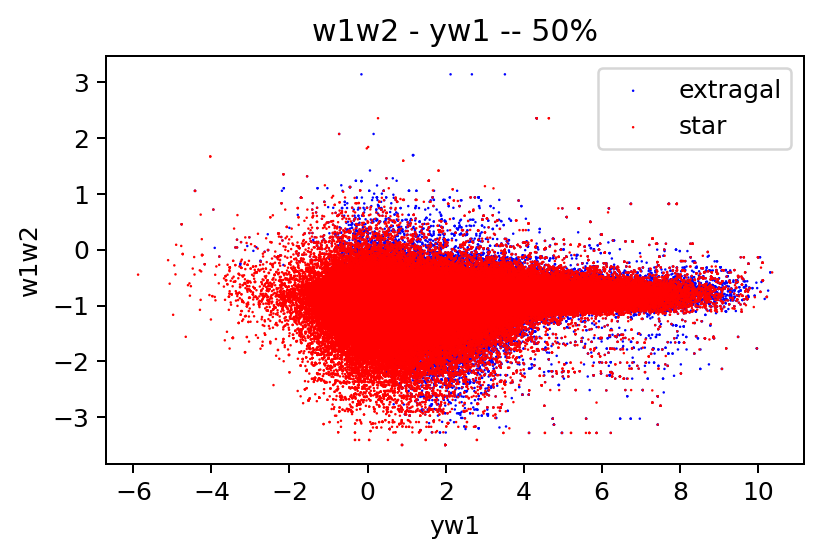

In [37]:
plt.scatter(df_gpq_test_extragal['yw1'],df_gpq_test_extragal['w1w2'],
                c='b',s=1,edgecolor='none',label='extragal')
plt.scatter(df_gpq_test_star['yw1'],df_gpq_test_star['w1w2'],
            c='r',s=1,edgecolor='none',label='star',)

plt.xlabel('yw1')
plt.ylabel('w1w2')
plt.legend()
plt.title('w1w2 - yw1 -- 50%')

Text(0.5, 1.0, 'w1w2 - yw1 -- 50%')

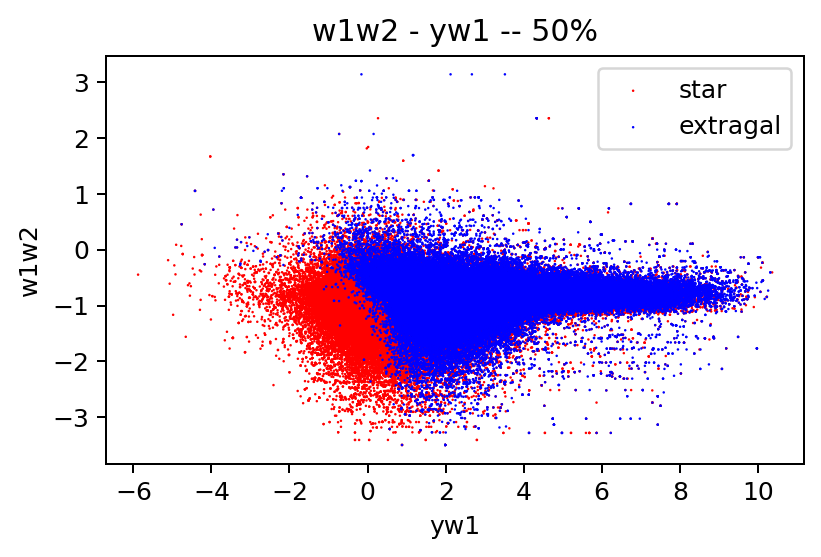

In [38]:
plt.scatter(df_gpq_test_star['yw1'],df_gpq_test_star['w1w2'],
            c='r',s=1,edgecolor='none',label='star',)
plt.scatter(df_gpq_test_extragal['yw1'],df_gpq_test_extragal['w1w2'],
                c='b',s=1,edgecolor='none',label='extragal')

plt.xlabel('yw1')
plt.ylabel('w1w2')
plt.legend()
plt.title('w1w2 - yw1 -- 50%')

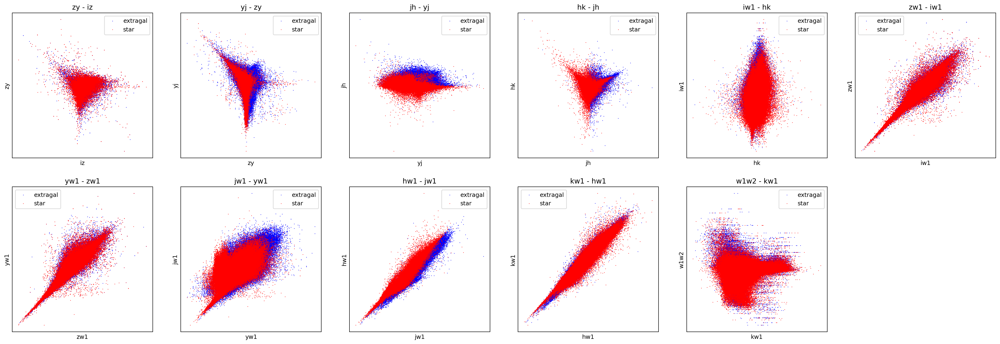

In [146]:
# # plot color-color diagram  ———— star在上

# plt.figure(figsize=(30,10))

# for i in range(11):
#     plt.subplot(2, 6, i+1)
#     plt.scatter(df_gpq_test_extragal[features[i]],df_gpq_test_extragal[features[i+1]],
#                 c='b',s=1,edgecolor='none',label='extragal')
#     plt.scatter(df_gpq_test_star[features[i]],df_gpq_test_star[features[i+1]],
#                 c='r',s=1,edgecolor='none',label='star',)
    
#     plt.xticks([])
#     plt.yticks([])
#     plt.xlabel(features[i])
#     plt.ylabel(features[i+1])
#     plt.legend()
#     plt.title(features[i+1]+' - '+features[i])

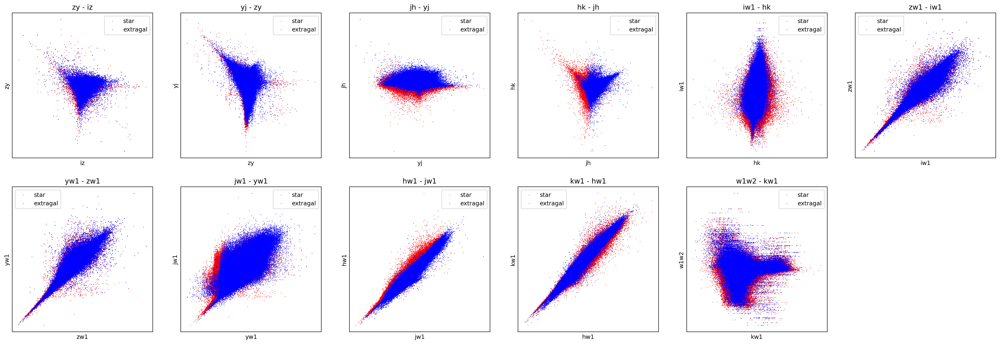

In [53]:
# # plot color-color diagram ———— extragal在上

# plt.figure(figsize=(30,10))

# for i in range(11):
#     plt.subplot(2, 6, i+1)
#     plt.scatter(df_gpq_test_star[features[i]],df_gpq_test_star[features[i+1]],
#                 c='r',s=1,edgecolor='none',label='star',)
#     plt.scatter(df_gpq_test_extragal[features[i]],df_gpq_test_extragal[features[i+1]],
#                 c='b',s=1,edgecolor='none',label='extragal')
    
#     plt.xticks([])
#     plt.yticks([])
#     plt.xlabel(features[i])
#     plt.ylabel(features[i+1])
#     plt.legend()
#     plt.title(features[i+1]+' - '+features[i])

## ii) test with 95% criterion -- 95% on extragal and the rest as stars

In [15]:
extragal_95_index = np.where(clf1.predict_proba(X1).T[0]>0.95)[0].tolist()
extragal_95 = df_gpq_test.iloc[extragal_95_index]

In [16]:
star_rest = df_gpq_test[~df_gpq_test.index.isin(extragal_95_index)]

In [17]:
star_rest.shape[0]+extragal_95.shape[0]

291226

Text(0.5, 1.0, 'y-w1 - w1-w2 -- 95%(star rest)')

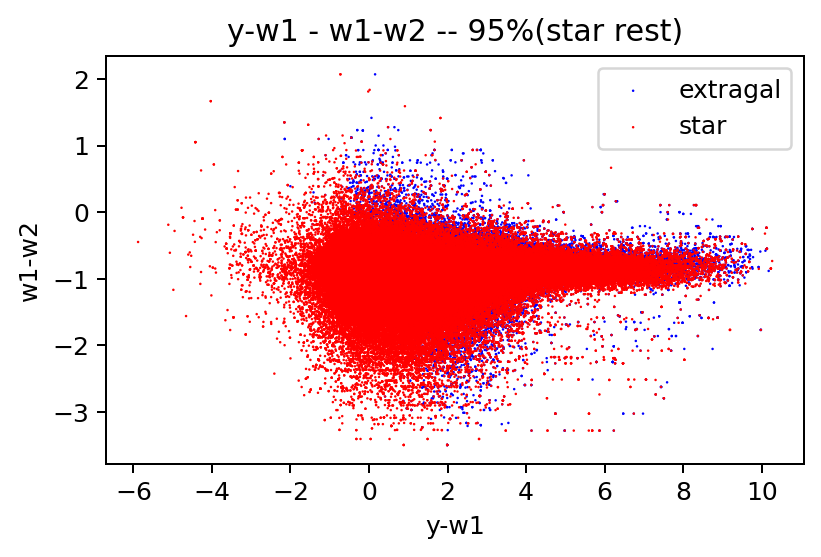

In [20]:
plt.scatter(extragal_95['yw1'],extragal_95['w1w2'],
                c='b',s=1,edgecolor='none',label='extragal')
plt.scatter(star_rest['yw1'],star_rest['w1w2'],
            c='r',s=1,edgecolor='none',label='star',)

plt.xlabel('y-w1')
plt.ylabel('w1-w2')
plt.legend()
plt.title('y-w1 - w1-w2 -- 95%(star rest)')

Text(0.5, 1.0, 'w1w2 - yw1 -- 95%(star rest)')

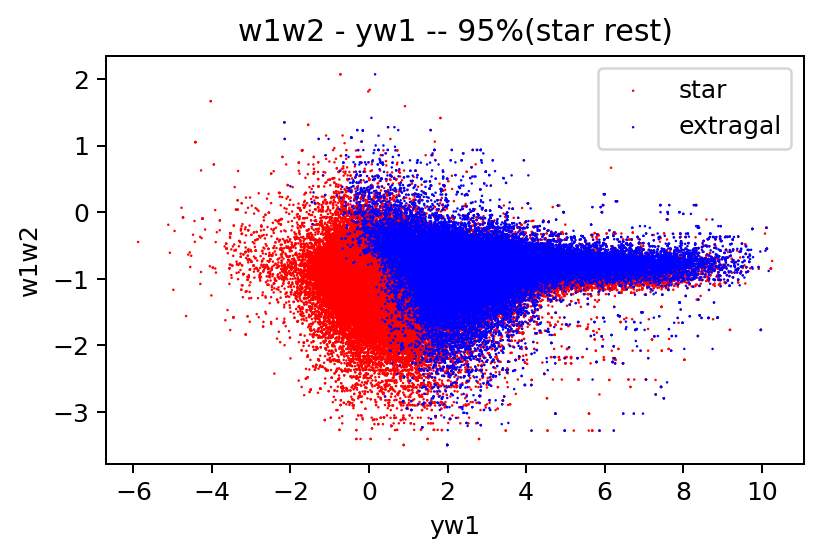

In [21]:
plt.scatter(star_rest['yw1'],star_rest['w1w2'],
            c='r',s=1,edgecolor='none',label='star',)
plt.scatter(extragal_95['yw1'],extragal_95['w1w2'],
                c='b',s=1,edgecolor='none',label='extragal')

plt.xlabel('yw1')
plt.ylabel('w1w2')
plt.legend()
plt.title('w1w2 - yw1 -- 95%(star rest)')

### iii) test with 95% criterion

In [48]:
extragal_95_index = np.where(clf1.predict_proba(X1).T[0]>0.95)[0].tolist()
star_95_index = np.where(clf1.predict_proba(X1).T[1]>0.95)[0].tolist()

In [49]:
extragal_95 = df_gpq_test.iloc[extragal_95_index]

In [50]:
star_95 = df_gpq_test.iloc[star_95_index]

Text(0.5, 1.0, 'w1w2 - yw1 -- 95%)')

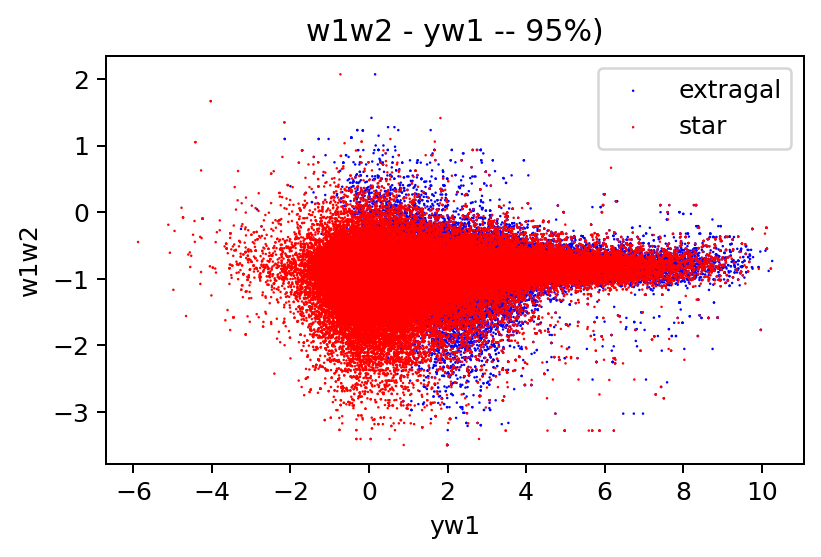

In [22]:
plt.scatter(extragal_95['yw1'],extragal_95['w1w2'],
                c='b',s=1,edgecolor='none',label='extragal')
plt.scatter(star_95['yw1'],star_95['w1w2'],
            c='r',s=1,edgecolor='none',label='star',)

plt.xlabel('yw1')
plt.ylabel('w1w2')
plt.legend()
plt.title('w1w2 - yw1 -- 95%)')

Text(0.5, 1.0, 'w1w2 - yw1 -- 95%')

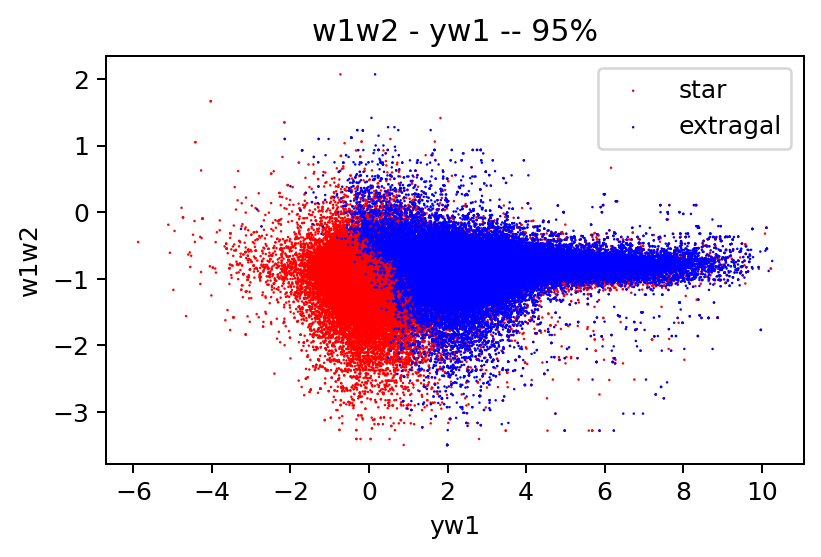

In [23]:
plt.scatter(star_95['yw1'],star_95['w1w2'],
            c='r',s=1,edgecolor='none',label='star',)
plt.scatter(extragal_95['yw1'],extragal_95['w1w2'],
                c='b',s=1,edgecolor='none',label='extragal')

plt.xlabel('yw1')
plt.ylabel('w1w2')
plt.legend()
plt.title('w1w2 - yw1 -- 95%')

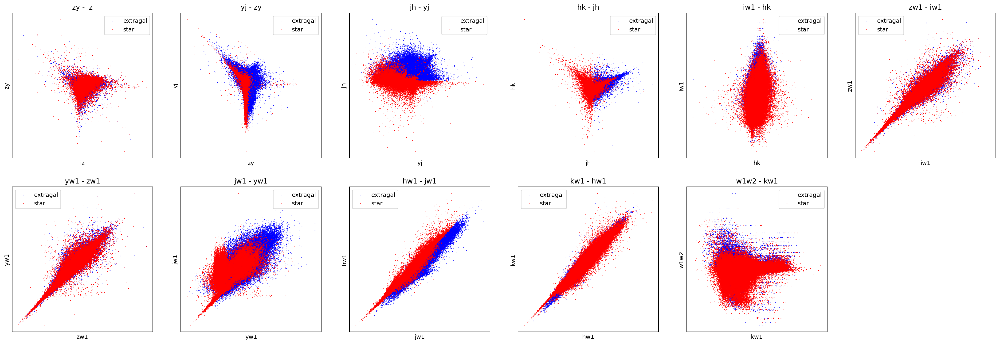

In [81]:
# # plot color-color diagram  ———— star在上

# plt.figure(figsize=(30,10))

# for i in range(11):
#     plt.subplot(2, 6, i+1)
#     plt.scatter(extragal_95[features[i]],extragal_95[features[i+1]],
#                 c='b',s=1,edgecolor='none',label='extragal')
#     plt.scatter(star_95[features[i]],star_95[features[i+1]],
#                 c='r',s=1,edgecolor='none',label='star',)
    
#     plt.xticks([])
#     plt.yticks([])
#     plt.xlabel(features[i])
#     plt.ylabel(features[i+1])
#     plt.legend()
#     plt.title(features[i+1]+' - '+features[i])

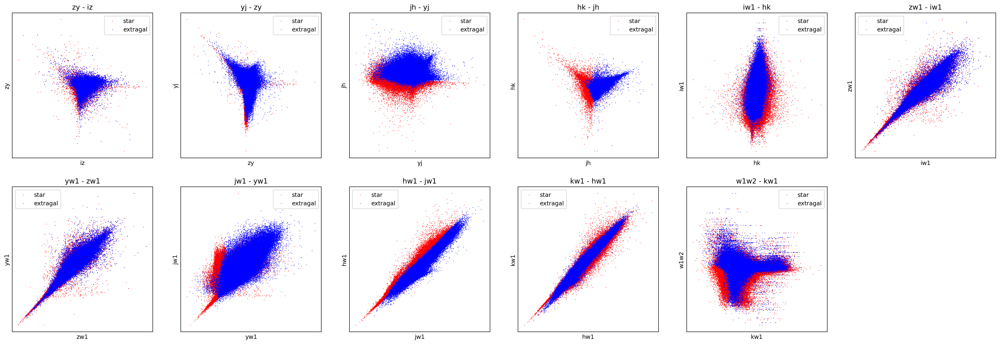

In [54]:
# # plot color-color diagram ———— extragal在上

# plt.figure(figsize=(30,10))

# for i in range(11):
#     plt.subplot(2, 6, i+1)
#     plt.scatter(star_95[features[i]],star_95[features[i+1]],
#                 c='r',s=1,edgecolor='none',label='star',)
#     plt.scatter(extragal_95[features[i]],extragal_95[features[i+1]],
#                 c='b',s=1,edgecolor='none',label='extragal')
    
    
#     plt.xticks([])
#     plt.yticks([])
#     plt.xlabel(features[i])
#     plt.ylabel(features[i+1])
#     plt.legend()
#     plt.title(features[i+1]+' - '+features[i])

## 2. qso vs galaxy

In [22]:
extragal_95.reset_index(inplace=True, drop=True)
extragal_95

,ra,dec,l,b,gps_pstar,gps_pgalaxy,gps_pnoise,gps_psaturated,g,r,...,hk,iw1,zw1,yw1,jw1,hw1,kw1,w1w2,ebv,n64pix
0,277.989194,-13.692333,18.547384,-1.978373,0.999999,5.292210e-07,5.292210e-07,0,21.1271,19.8247,...,-0.073596,4.5077,3.8095,4.1282,4.157000,3.670224,3.743820,-0.775,1.174636,25229
1,277.987829,-13.714007,18.527529,-1.987192,0.999819,1.710000e-04,9.524265e-06,0,NaN,22.5994,...,-0.351601,4.5017,3.5179,4.2979,2.370050,2.039675,2.391276,-0.771,1.216132,25229
2,277.987855,-13.788220,18.461650,-2.021438,0.999999,5.292210e-07,5.292210e-07,0,21.3552,19.9951,...,-0.419911,3.0036,2.6187,3.1018,2.107475,1.832988,2.252899,-1.049,1.324202,25229
3,277.989055,-13.812215,18.440883,-2.033537,0.999999,5.292210e-07,5.292210e-07,0,NaN,23.0495,...,-0.293183,3.7087,2.6330,2.9632,1.791379,1.518021,1.811204,-0.660,1.324202,25229
4,277.987174,-13.813436,18.438956,-2.032480,0.999999,5.292210e-07,5.292210e-07,0,20.3721,18.0767,...,-0.201555,2.7146,1.9709,1.5172,0.708621,0.174559,0.376114,-0.812,1.324202,25229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70303,294.642136,22.962814,58.588227,0.605074,0.999999,5.292210e-07,5.292210e-07,0,24.5394,22.3752,...,-0.177115,6.0984,5.2881,4.7493,3.936309,3.480874,3.657989,-0.787,4.774439,24234
70304,294.525966,22.963812,58.536634,0.698779,0.999999,5.292210e-07,5.292210e-07,0,21.6042,20.0098,...,-0.276660,2.8277,2.3843,1.9593,1.561015,1.279180,1.555840,-0.811,4.546389,24234
70305,294.677759,22.963565,58.604983,0.576865,0.999999,5.292210e-07,5.292210e-07,0,NaN,24.5657,...,0.305818,4.8789,4.1395,3.3996,1.843970,0.781697,0.475879,-1.388,5.078757,24234
70306,294.645434,22.963594,58.590397,0.602810,0.999819,1.710000e-04,9.524265e-06,0,24.5060,23.0958,...,-0.214136,4.2441,3.3063,2.8848,2.078773,1.525361,1.739497,-0.915,4.893065,24234


In [23]:
X2 = extragal_95[features].values
X2.shape

(70308, 12)

### i) test with 50% criterion

In [24]:
clf2.predict(X2)

array([0, 0, 0, ..., 0, 0, 0])

In [52]:
extragal_95['Pred_class_2_50'] = clf2.predict(X2)
# df_gpq_test_extragal['Pred_class_2_50'] = clf2.predict(X2)

<ipython-input-52-b2fe0acd1267>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  extragal_95['Pred_class_2_50'] = clf2.predict(X2)


In [53]:
extragal_95['Pred_class_2_50'].value_counts()

# 165343 galaxy, 8159 qso

0    109141
1      5504
Name: Pred_class_2_50, dtype: int64

In [68]:
# df_gpq_test_extragal['Pred_class_2_50'].value_counts()

# # 255895 galaxy, 19710 qso

0    255895
1     19710
Name: Pred_class_2_50, dtype: int64

In [54]:
df_gpq_test_qso = extragal_95[extragal_95.Pred_class_2_50==1]
df_gpq_test_galaxy = extragal_95[extragal_95.Pred_class_2_50==0]

# df_gpq_test_qso = df_gpq_test_extragal[df_gpq_test_extragal.Pred_class_2_50==1]
# df_gpq_test_galaxy = df_gpq_test_extragal[df_gpq_test_extragal.Pred_class_2_50==0]

Text(0.5, 1.0, 'w1w2 - yw1 -- 95% 50%')

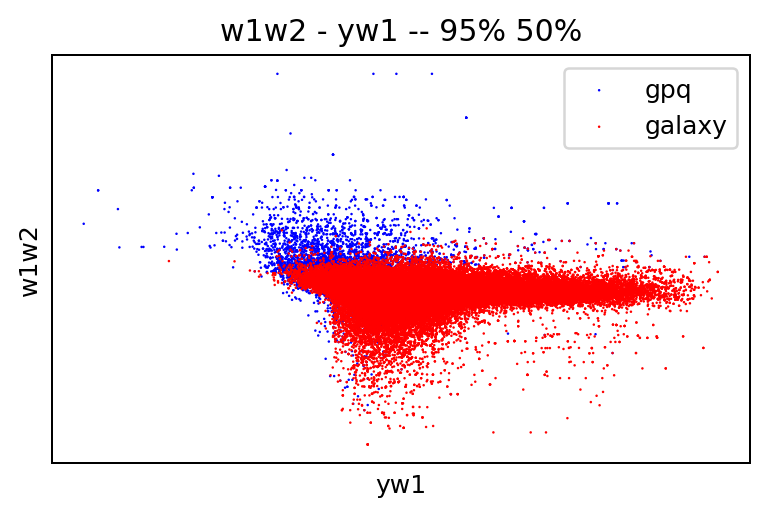

In [55]:
# plot color-color diagram ———— galaxy在上
plt.scatter(df_gpq_test_qso['yw1'],df_gpq_test_qso['w1w2'],
                c='b',s=1,edgecolor='none',label='gpq')
plt.scatter(df_gpq_test_galaxy['yw1'],df_gpq_test_galaxy['w1w2'],
            c='r',s=1,edgecolor='none',label='galaxy',)


plt.xticks([])
plt.yticks([])
plt.xlabel('yw1')
plt.ylabel('w1w2')
plt.legend()
plt.title('w1w2 - yw1 -- 95% 50%')

Text(0.5, 1.0, 'w1w2 - yw1 -- 95% 50%')

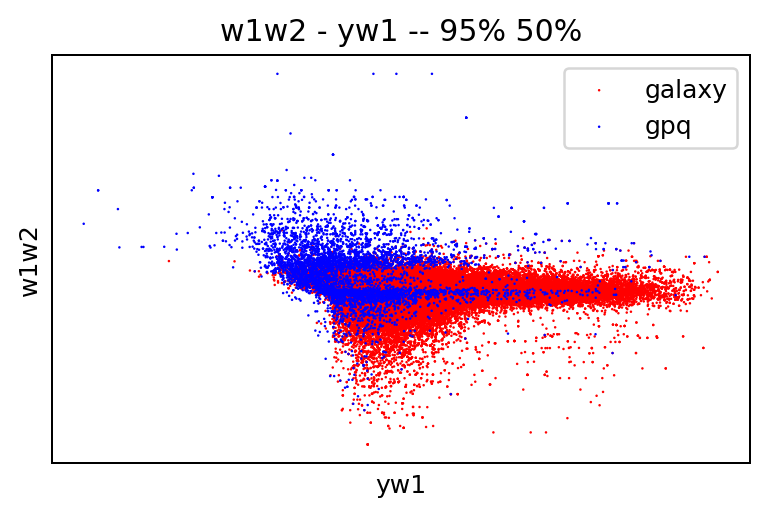

In [56]:
# plot color-color diagram ———— qso在上
plt.scatter(df_gpq_test_galaxy['yw1'],df_gpq_test_galaxy['w1w2'],
            c='r',s=1,edgecolor='none',label='galaxy')
plt.scatter(df_gpq_test_qso['yw1'],df_gpq_test_qso['w1w2'],
                c='b',s=1,edgecolor='none',label='gpq')

plt.xticks([])
plt.yticks([])
plt.xlabel('yw1')
plt.ylabel('w1w2')
plt.legend()
plt.title('w1w2 - yw1 -- 95% 50%')

Text(0.5, 1.0, 'w1w2 - yw1 -- 50%')

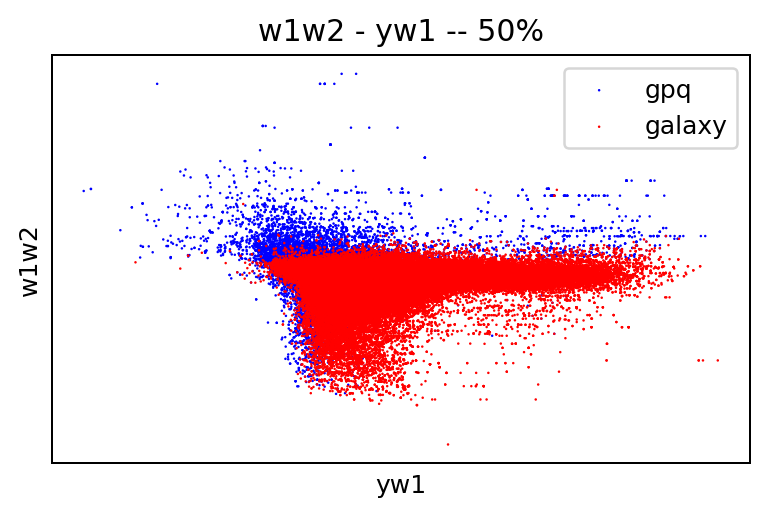

In [72]:
# # plot color-color diagram ———— galaxy在上
# plt.scatter(df_gpq_test_qso['yw1'],df_gpq_test_qso['w1w2'],
#                 c='b',s=1,edgecolor='none',label='gpq')
# plt.scatter(df_gpq_test_galaxy['yw1'],df_gpq_test_galaxy['w1w2'],
#             c='r',s=1,edgecolor='none',label='galaxy',)


# # plt.xticks([])
# plt.yticks([])
# plt.xlabel('yw1')
# plt.ylabel('w1w2')
# plt.legend()
# plt.title('w1w2 - yw1 -- 50%')

Text(0.5, 1.0, 'w1w2 - yw1 -- 50%')

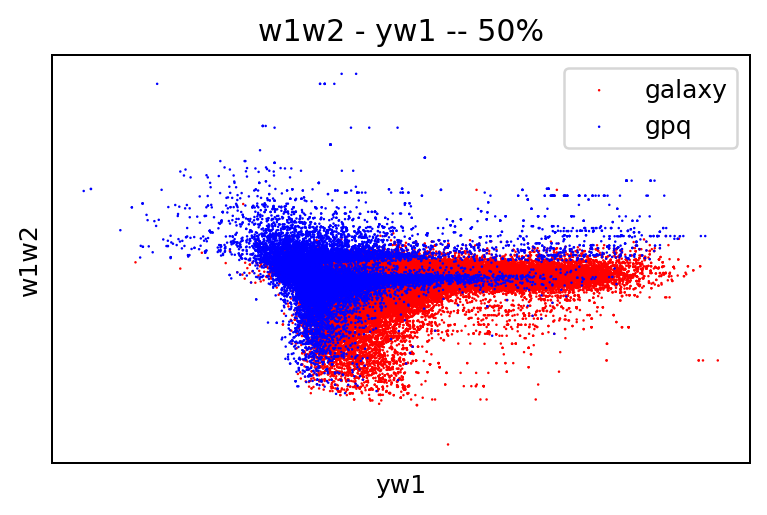

In [73]:
# # plot color-color diagram ———— qso在上
# plt.scatter(df_gpq_test_galaxy['yw1'],df_gpq_test_galaxy['w1w2'],
#             c='r',s=1,edgecolor='none',label='galaxy')
# plt.scatter(df_gpq_test_qso['yw1'],df_gpq_test_qso['w1w2'],
#                 c='b',s=1,edgecolor='none',label='gpq')

# plt.xticks([])
# plt.yticks([])
# plt.xlabel('yw1')
# plt.ylabel('w1w2')
# plt.legend()
# plt.title('w1w2 - yw1 -- 50%')

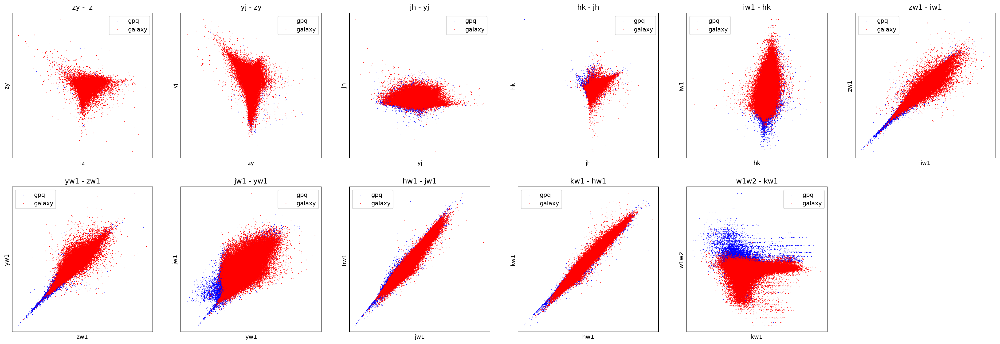

In [89]:
# # plot color-color diagram

# plt.figure(figsize=(30,10))

# for i in range(11):
#     plt.subplot(2, 6, i+1)
#     plt.scatter(df_gpq_test_qso[features[i]],df_gpq_test_qso[features[i+1]],
#                 c='b',s=1,edgecolor='none',label='gpq')
#     plt.scatter(df_gpq_test_galaxy[features[i]],df_gpq_test_galaxy[features[i+1]],
#                 c='r',s=1,edgecolor='none',label='galaxy',)
    
#     plt.xticks([])
#     plt.yticks([])
#     plt.xlabel(features[i])
#     plt.ylabel(features[i+1])
#     plt.legend()
#     plt.title(features[i+1]+' - '+features[i])

### ii) test with 95% criterion

In [25]:
clf2.predict_proba(X2)  # 0:galaxy, 1:qso

array([[0.99273217, 0.00726784],
       [0.99759895, 0.00240103],
       [0.9981874 , 0.00181258],
       ...,
       [0.9978942 , 0.00210576],
       [0.99745595, 0.00254402],
       [0.874703  , 0.12529702]], dtype=float32)

In [31]:
gpq_99_index = np.where(clf2.predict_proba(X2).T[1]>0.99)[0].tolist()
galaxy_99_index = np.where(clf2.predict_proba(X2).T[0]>0.99)[0].tolist()

In [27]:
extragal_95

,ra,dec,l,b,gps_pstar,gps_pgalaxy,gps_pnoise,gps_psaturated,g,r,...,hk,iw1,zw1,yw1,jw1,hw1,kw1,w1w2,ebv,n64pix
0,277.989194,-13.692333,18.547384,-1.978373,0.999999,5.292210e-07,5.292210e-07,0,21.1271,19.8247,...,-0.073596,4.5077,3.8095,4.1282,4.157000,3.670224,3.743820,-0.775,1.174636,25229
1,277.987829,-13.714007,18.527529,-1.987192,0.999819,1.710000e-04,9.524265e-06,0,NaN,22.5994,...,-0.351601,4.5017,3.5179,4.2979,2.370050,2.039675,2.391276,-0.771,1.216132,25229
2,277.987855,-13.788220,18.461650,-2.021438,0.999999,5.292210e-07,5.292210e-07,0,21.3552,19.9951,...,-0.419911,3.0036,2.6187,3.1018,2.107475,1.832988,2.252899,-1.049,1.324202,25229
3,277.989055,-13.812215,18.440883,-2.033537,0.999999,5.292210e-07,5.292210e-07,0,NaN,23.0495,...,-0.293183,3.7087,2.6330,2.9632,1.791379,1.518021,1.811204,-0.660,1.324202,25229
4,277.987174,-13.813436,18.438956,-2.032480,0.999999,5.292210e-07,5.292210e-07,0,20.3721,18.0767,...,-0.201555,2.7146,1.9709,1.5172,0.708621,0.174559,0.376114,-0.812,1.324202,25229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70303,294.642136,22.962814,58.588227,0.605074,0.999999,5.292210e-07,5.292210e-07,0,24.5394,22.3752,...,-0.177115,6.0984,5.2881,4.7493,3.936309,3.480874,3.657989,-0.787,4.774439,24234
70304,294.525966,22.963812,58.536634,0.698779,0.999999,5.292210e-07,5.292210e-07,0,21.6042,20.0098,...,-0.276660,2.8277,2.3843,1.9593,1.561015,1.279180,1.555840,-0.811,4.546389,24234
70305,294.677759,22.963565,58.604983,0.576865,0.999999,5.292210e-07,5.292210e-07,0,NaN,24.5657,...,0.305818,4.8789,4.1395,3.3996,1.843970,0.781697,0.475879,-1.388,5.078757,24234
70306,294.645434,22.963594,58.590397,0.602810,0.999819,1.710000e-04,9.524265e-06,0,24.5060,23.0958,...,-0.214136,4.2441,3.3063,2.8848,2.078773,1.525361,1.739497,-0.915,4.893065,24234


In [32]:
gpq_99 = extragal_95.iloc[gpq_99_index]

In [33]:
gpq_99

,ra,dec,l,b,gps_pstar,gps_pgalaxy,gps_pnoise,gps_psaturated,g,r,...,hk,iw1,zw1,yw1,jw1,hw1,kw1,w1w2,ebv,n64pix
488,277.906272,-13.769317,18.441859,-1.942417,9.999960e-01,3.402125e-06,6.804250e-07,0,21.0947,19.6396,...,-0.419918,1.1473,0.6722,0.7058,-0.001360,0.016744,0.436662,0.223,1.065152,25229
500,277.905493,-13.768276,18.442434,-1.941265,9.988870e-01,1.101000e-03,1.223406e-05,0,21.0778,19.8178,...,-0.201279,1.2113,0.8524,0.8956,0.323255,0.222997,0.424276,0.223,1.065152,25229
501,277.905590,-13.767395,18.443260,-1.940942,9.967530e-01,1.710000e-04,3.076000e-03,0,19.7794,18.7335,...,NaN,0.2700,-0.0067,-0.3288,1.719985,1.497460,NaN,0.223,1.065152,25229
502,277.905163,-13.768256,18.442304,-1.940972,1.333330e-01,8.571430e-01,9.524000e-03,0,21.0778,19.8178,...,NaN,1.2113,0.8524,0.8956,1.295842,NaN,NaN,0.223,1.065152,25229
503,277.905130,-13.767667,18.442812,-1.940671,5.292210e-07,9.999990e-01,5.292210e-07,0,19.7794,18.7335,...,-0.397091,0.2700,-0.0067,-0.3288,-0.425397,-0.562053,-0.164962,0.223,1.065152,25229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70212,294.608576,22.959025,58.569761,0.630139,9.000000e-01,5.000000e-02,5.000000e-02,0,22.5032,20.6950,...,NaN,3.4590,2.6870,2.3139,4.413704,NaN,NaN,0.366,4.743026,24234
70218,294.602807,22.959241,58.567344,0.634874,9.999990e-01,5.292210e-07,5.292210e-07,0,22.4638,20.6088,...,-0.005403,1.6363,0.9162,0.5774,2.418777,2.153562,2.158965,0.538,4.743026,24234
70226,294.603615,22.959480,58.567917,0.634343,9.999990e-01,5.292210e-07,5.292210e-07,0,22.4638,20.6088,...,-0.161634,1.6363,0.9162,0.5774,-0.133494,-0.326268,-0.164634,0.538,4.743026,24234
70228,294.604554,22.959550,58.568402,0.633624,9.999990e-01,5.292210e-07,5.292210e-07,0,22.5869,20.8522,...,-0.204550,2.0148,1.3119,1.0053,0.205148,-0.113402,0.091148,0.538,4.743026,24234


In [34]:
galaxy_rest = extragal_95[~extragal_95.index.isin(gpq_99_index)]
galaxy_99 = extragal_95.iloc[galaxy_99_index]

Text(0.5, 1.0, 'w1w2 - yw1 -- 95% 99%')

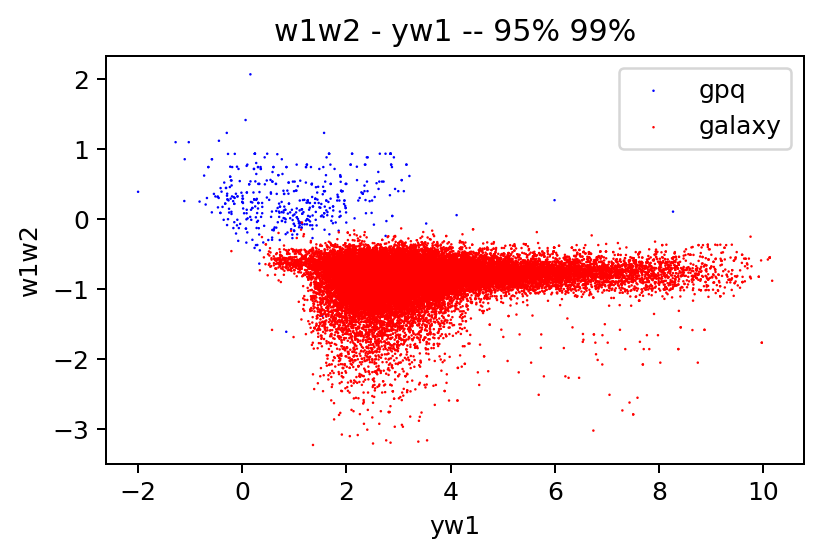

In [35]:
plt.scatter(gpq_99['yw1'],gpq_99['w1w2'],
                c='b',s=1,edgecolor='none',label='gpq')
plt.scatter(galaxy_99['yw1'],galaxy_99['w1w2'],
            c='r',s=1,edgecolor='none',label='galaxy',)


# plt.xticks([])
# plt.yticks([])
plt.xlabel('yw1')
plt.ylabel('w1w2')
plt.legend()
plt.title('w1w2 - yw1 -- 95% 99%')

Text(0.5, 1.0, 'w1w2 - yw1 -- 95% 99%')

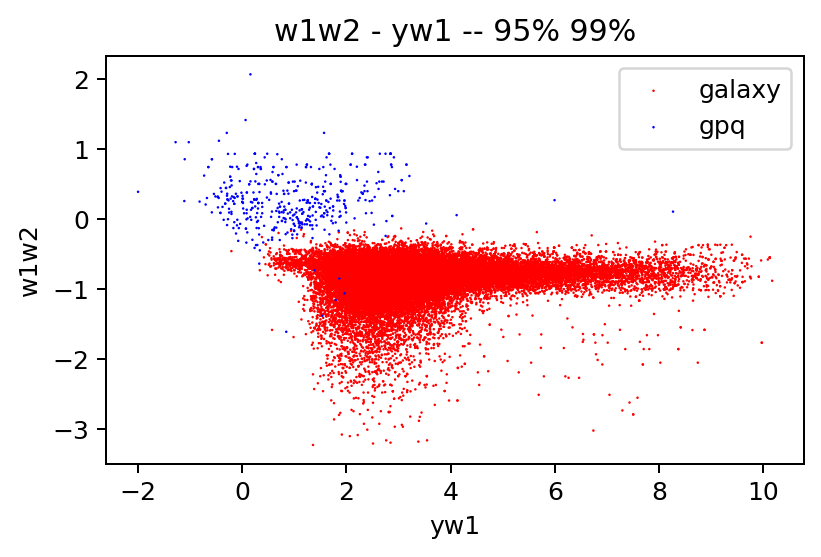

In [39]:
plt.scatter(galaxy_99['yw1'],galaxy_99['w1w2'],
            c='r',s=1,edgecolor='none',label='galaxy',)
plt.scatter(gpq_99['yw1'],gpq_99['w1w2'],
                c='b',s=1,edgecolor='none',label='gpq')

# plt.xticks([])
# plt.yticks([])
plt.xlabel('yw1')
plt.ylabel('w1w2')
plt.legend()
plt.title('w1w2 - yw1 -- 95% 99%')

Text(0.5, 1.0, 'w1w2 - yw1 -- 95% 99%(galaxy rest)')

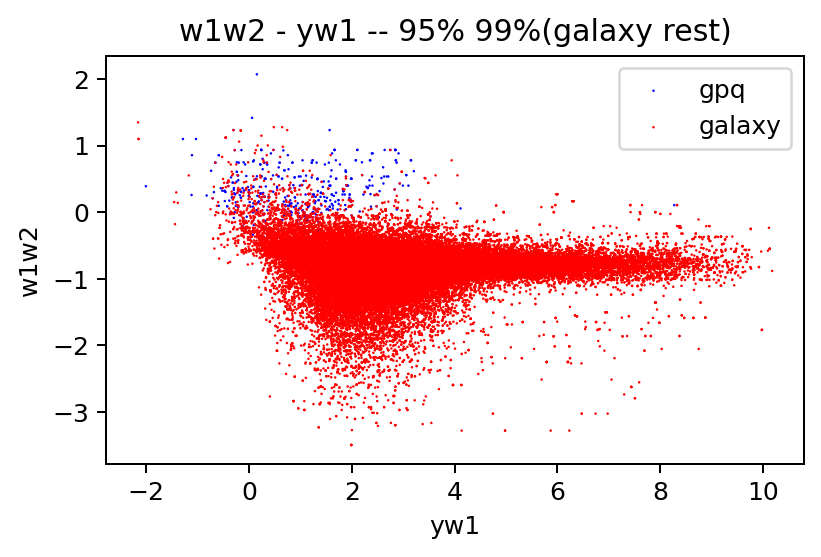

In [38]:
plt.scatter(gpq_99['yw1'],gpq_99['w1w2'],
                c='b',s=1,edgecolor='none',label='gpq')
plt.scatter(galaxy_rest['yw1'],galaxy_rest['w1w2'],
            c='r',s=1,edgecolor='none',label='galaxy',)


# plt.xticks([])
# plt.yticks([])
plt.xlabel('yw1')
plt.ylabel('w1w2')
plt.legend()
plt.title('w1w2 - yw1 -- 95% 99%(galaxy rest)')

Text(0.5, 1.0, 'w1w2 - yw1 -- 95% 99%(galaxy rest)')

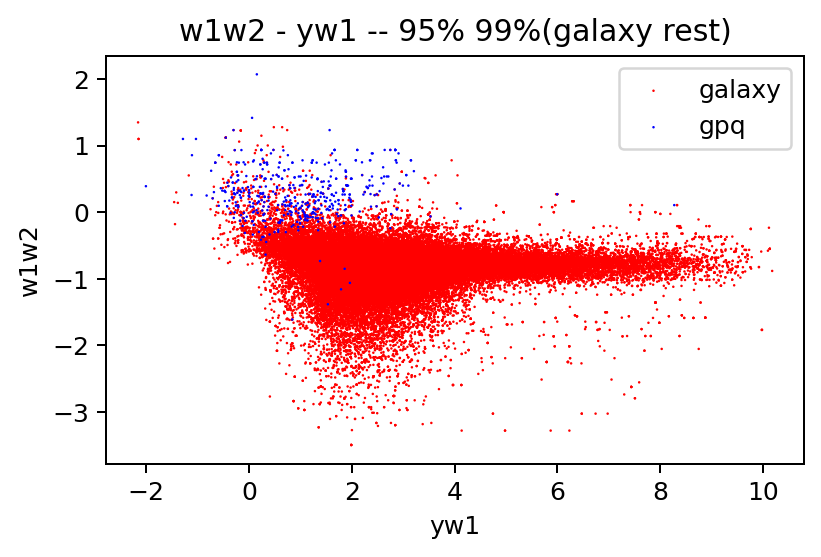

In [40]:
plt.scatter(galaxy_rest['yw1'],galaxy_rest['w1w2'],
            c='r',s=1,edgecolor='none',label='galaxy',)
plt.scatter(gpq_99['yw1'],gpq_99['w1w2'],
                c='b',s=1,edgecolor='none',label='gpq')

# plt.xticks([])
# plt.yticks([])
plt.xlabel('yw1')
plt.ylabel('w1w2')
plt.legend()
plt.title('w1w2 - yw1 -- 95% 99%(galaxy rest)')

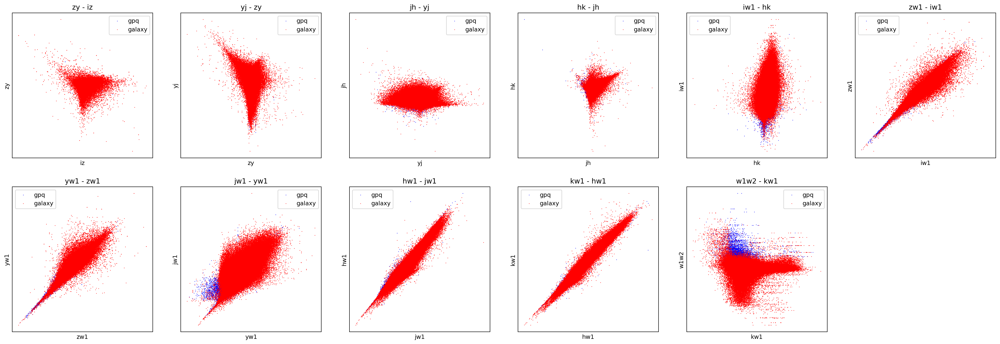

In [69]:
# # plot color-color diagram ---- galaxy_95 = df_gpq_test_extragal[~df_gpq_test_extragal.index.isin(gpq_95_index)]

# plt.figure(figsize=(30,10))

# for i in range(11):
#     plt.subplot(2, 6, i+1)
#     plt.scatter(gpq_95[features[i]],gpq_95[features[i+1]],
#                 c='b',s=1,edgecolor='none',label='gpq')
#     plt.scatter(galaxy_95[features[i]],galaxy_95[features[i+1]],
#                 c='r',s=1,edgecolor='none',label='galaxy',)
    
#     plt.xticks([])
#     plt.yticks([])
#     plt.xlabel(features[i])
#     plt.ylabel(features[i+1])
#     plt.legend()
#     plt.title(features[i+1]+' - '+features[i])
    
# ## feature importance: w1-w2, y-j

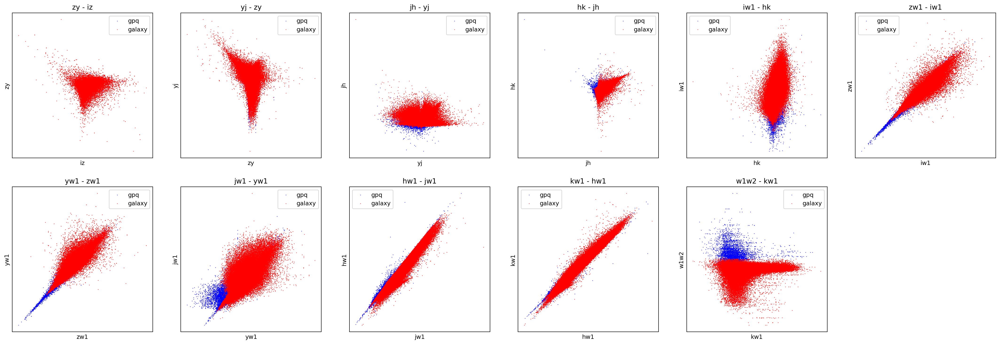

In [77]:
# # plot color-color diagram ---- galaxy_95 = df_gpq_test_extragal.iloc[galaxy_95_index]

# plt.figure(figsize=(30,10))

# for i in range(11):
#     plt.subplot(2, 6, i+1)
#     plt.scatter(gpq_95[features[i]],gpq_95[features[i+1]],
#                 c='b',s=1,edgecolor='none',label='gpq')
#     plt.scatter(galaxy_95[features[i]],galaxy_95[features[i+1]],
#                 c='r',s=1,edgecolor='none',label='galaxy',)
    
#     plt.xticks([])
#     plt.yticks([])
#     plt.xlabel(features[i])
#     plt.ylabel(features[i+1])
#     plt.legend()
#     plt.title(features[i+1]+' - '+features[i])
    
# ## feature importance: w1-w2, y-j

Text(0.5, 1.0, 'w1w2 - yw1 --95% 50%')

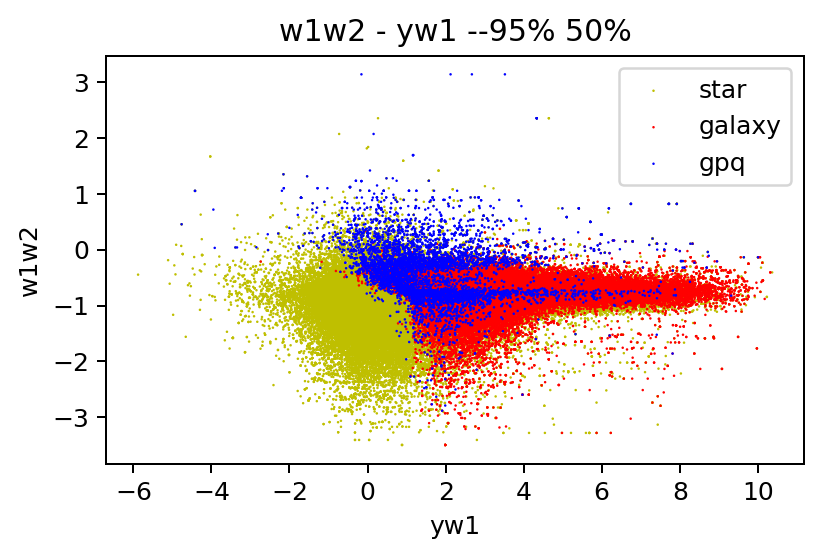

In [69]:
# plot star,galaxy and qso on one figure

plt.scatter(star_95['yw1'],star_95['w1w2'],
            c='y',s=1,edgecolor='none',label='star',)
plt.scatter(df_gpq_test_galaxy['yw1'],df_gpq_test_galaxy['w1w2'],
            c='r',s=1,edgecolor='none',label='galaxy',)
plt.scatter(df_gpq_test_qso['yw1'],df_gpq_test_qso['w1w2'],
                c='b',s=1,edgecolor='none',label='gpq')



# plt.xticks([])
# plt.yticks([])
plt.xlabel('yw1')
plt.ylabel('w1w2')
plt.legend()
plt.title('w1w2 - yw1 --95% 50%')


Text(0.5, 1.0, 'w1w2 - yw1 -- 95% 95%')

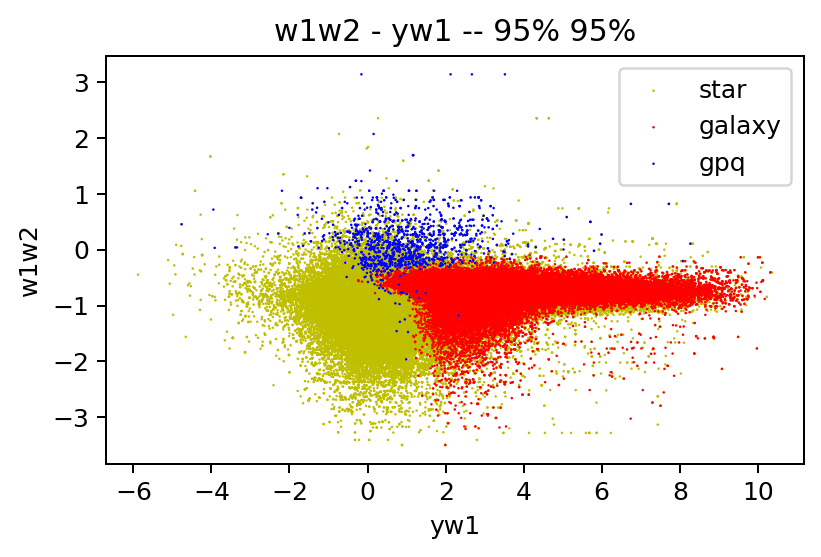

In [70]:
plt.scatter(star_95['yw1'],star_95['w1w2'],
            c='y',s=1,edgecolor='none',label='star',)
plt.scatter(galaxy_95['yw1'],galaxy_95['w1w2'],
            c='r',s=1,edgecolor='none',label='galaxy',)
plt.scatter(gpq_95['yw1'],gpq_95['w1w2'],
                c='b',s=1,edgecolor='none',label='gpq')

# plt.xticks([])
# plt.yticks([])
plt.xlabel('yw1')
plt.ylabel('w1w2')
plt.legend()
plt.title('w1w2 - yw1 -- 95% 95%')

Text(0.5, 1.0, 'w1w2 - yw1 -- 95% 95%')

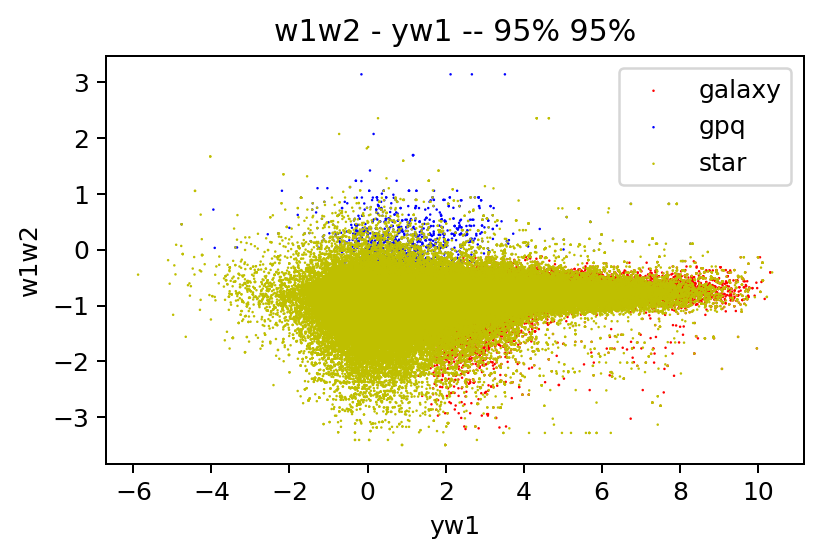

In [71]:
plt.scatter(galaxy_95['yw1'],galaxy_95['w1w2'],
            c='r',s=1,edgecolor='none',label='galaxy',)
plt.scatter(gpq_95['yw1'],gpq_95['w1w2'],
                c='b',s=1,edgecolor='none',label='gpq')
plt.scatter(star_95['yw1'],star_95['w1w2'],
            c='y',s=1,edgecolor='none',label='star',)

# plt.xticks([])
# plt.yticks([])
plt.xlabel('yw1')
plt.ylabel('w1w2')
plt.legend()
plt.title('w1w2 - yw1 -- 95% 95%')

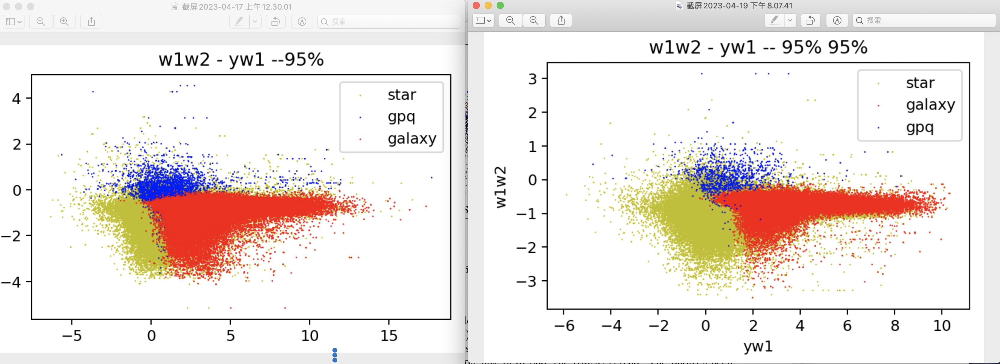

In [ ]:
# 右边是修改后（star样本v2，ypsfmagerr<0.2171）

## combine star&galaxy&qso into one dataset

In [41]:
gpq_99['Pred_class'] = 'QSO'
galaxy_rest['Pred_class'] = 'GALAXY'
star_rest['Pred_class'] = 'STAR'

<ipython-input-41-ff2d644b6a0c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gpq_99['Pred_class'] = 'QSO'
<ipython-input-41-ff2d644b6a0c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  galaxy_rest['Pred_class'] = 'GALAXY'
<ipython-input-41-ff2d644b6a0c>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexi

In [42]:
df_3class_99 = pd.concat([gpq_99,galaxy_rest,star_rest])

In [43]:
df_3class_99

,ra,dec,l,b,gps_pstar,gps_pgalaxy,gps_pnoise,gps_psaturated,g,r,...,iw1,zw1,yw1,jw1,hw1,kw1,w1w2,ebv,n64pix,Pred_class
488,277.906272,-13.769317,18.441859,-1.942417,9.999960e-01,3.402125e-06,6.804250e-07,0,21.0947,19.6396,...,1.1473,0.6722,0.7058,-0.001360,0.016744,0.436662,0.223,1.065152,25229,QSO
500,277.905493,-13.768276,18.442434,-1.941265,9.988870e-01,1.101000e-03,1.223406e-05,0,21.0778,19.8178,...,1.2113,0.8524,0.8956,0.323255,0.222997,0.424276,0.223,1.065152,25229,QSO
501,277.905590,-13.767395,18.443260,-1.940942,9.967530e-01,1.710000e-04,3.076000e-03,0,19.7794,18.7335,...,0.2700,-0.0067,-0.3288,1.719985,1.497460,NaN,0.223,1.065152,25229,QSO
502,277.905163,-13.768256,18.442304,-1.940972,1.333330e-01,8.571430e-01,9.524000e-03,0,21.0778,19.8178,...,1.2113,0.8524,0.8956,1.295842,NaN,NaN,0.223,1.065152,25229,QSO
503,277.905130,-13.767667,18.442812,-1.940671,5.292210e-07,9.999990e-01,5.292210e-07,0,19.7794,18.7335,...,0.2700,-0.0067,-0.3288,-0.425397,-0.562053,-0.164962,0.223,1.065152,25229,QSO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
291217,294.536892,22.963357,58.541168,0.689787,9.999990e-01,5.292210e-07,5.292210e-07,0,21.9422,20.0229,...,1.1912,0.3947,-0.0464,-0.711385,-0.852275,-0.715723,-0.796,4.546389,24234,STAR
291218,294.536380,22.963768,58.541296,0.690400,9.999990e-01,5.292210e-07,5.292210e-07,0,21.9422,20.0229,...,1.1912,0.3947,-0.0464,1.083980,0.303212,0.242471,-0.796,4.546389,24234,STAR
291222,294.616834,22.963743,58.577603,0.625828,9.999990e-01,5.292210e-07,5.292210e-07,0,16.0863,15.3375,...,-0.4776,-0.7663,-0.9371,4.271983,3.802100,3.871926,-0.600,4.774439,24234,STAR
291224,294.608750,22.963842,58.574038,0.632363,9.999990e-01,5.292210e-07,5.292210e-07,0,25.6742,23.4138,...,5.0148,4.2609,3.9102,3.858811,1.840257,1.007732,-1.053,4.743026,24234,STAR


In [44]:
df_3class_99.reset_index(inplace=True, drop=True)

# Predicted proba 用star_rest, galaxy_rest算，可以最大限度降低概率
# 画图时用star_95, galaxy_95，可以更明显地区分

In [45]:
df_3class_99.Pred_class.value_counts()

# 类星体predicted概率：465/291226=0.00160
# 类星体predicted概率：888/291226=0.00300
# 类星体predicted概率：1251/537678=0.00233

STAR      220918
GALAXY     69843
QSO          465
Name: Pred_class, dtype: int64

In [46]:
df_3class_99.to_csv('pred_3class_95%x99%.csv')

In [51]:
gpq_95['Pred_class'] = 'QSO'
galaxy_99['Pred_class'] = 'GALAXY'
star_95['Pred_class'] = 'STAR'

<ipython-input-51-990fddb550a2>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gpq_95['Pred_class'] = 'QSO'
<ipython-input-51-990fddb550a2>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  galaxy_99['Pred_class'] = 'GALAXY'
<ipython-input-51-990fddb550a2>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing

In [52]:
df_3class_9599 = pd.concat([gpq_99,galaxy_99,star_95])
df_3class_9599.rename(columns={'index':'index_3','level_0':'index_2','level_1':'index_1'},inplace=True)
df_3class_9599.reset_index(inplace=True)

In [53]:
df_3class_9599

,index,ra,dec,l,b,gps_pstar,gps_pgalaxy,gps_pnoise,gps_psaturated,g,...,iw1,zw1,yw1,jw1,hw1,kw1,w1w2,ebv,n64pix,Pred_class
0,488,277.906272,-13.769317,18.441859,-1.942417,9.999960e-01,3.402125e-06,6.804250e-07,0,21.0947,...,1.1473,0.6722,0.7058,-0.001360,0.016744,0.436662,0.223,1.065152,25229,QSO
1,500,277.905493,-13.768276,18.442434,-1.941265,9.988870e-01,1.101000e-03,1.223406e-05,0,21.0778,...,1.2113,0.8524,0.8956,0.323255,0.222997,0.424276,0.223,1.065152,25229,QSO
2,501,277.905590,-13.767395,18.443260,-1.940942,9.967530e-01,1.710000e-04,3.076000e-03,0,19.7794,...,0.2700,-0.0067,-0.3288,1.719985,1.497460,NaN,0.223,1.065152,25229,QSO
3,502,277.905163,-13.768256,18.442304,-1.940972,1.333330e-01,8.571430e-01,9.524000e-03,0,21.0778,...,1.2113,0.8524,0.8956,1.295842,NaN,NaN,0.223,1.065152,25229,QSO
4,503,277.905130,-13.767667,18.442812,-1.940671,5.292210e-07,9.999990e-01,5.292210e-07,0,19.7794,...,0.2700,-0.0067,-0.3288,-0.425397,-0.562053,-0.164962,0.223,1.065152,25229,QSO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153580,291212,294.773905,22.963094,58.648065,0.499526,1.710000e-04,9.996570e-01,1.710000e-04,0,22.7254,...,1.0097,0.2292,-0.1755,1.384100,0.531523,NaN,-1.405,5.557242,24234,STAR
153581,291213,294.642968,22.962128,58.588005,0.604069,9.999990e-01,5.292210e-07,5.292210e-07,0,20.1749,...,2.0344,1.3091,0.7636,-0.096710,-0.538239,-0.396387,-0.787,4.893065,24234,STAR
153582,291217,294.536892,22.963357,58.541168,0.689787,9.999990e-01,5.292210e-07,5.292210e-07,0,21.9422,...,1.1912,0.3947,-0.0464,-0.711385,-0.852275,-0.715723,-0.796,4.546389,24234,STAR
153583,291218,294.536380,22.963768,58.541296,0.690400,9.999990e-01,5.292210e-07,5.292210e-07,0,21.9422,...,1.1912,0.3947,-0.0464,1.083980,0.303212,0.242471,-0.796,4.546389,24234,STAR


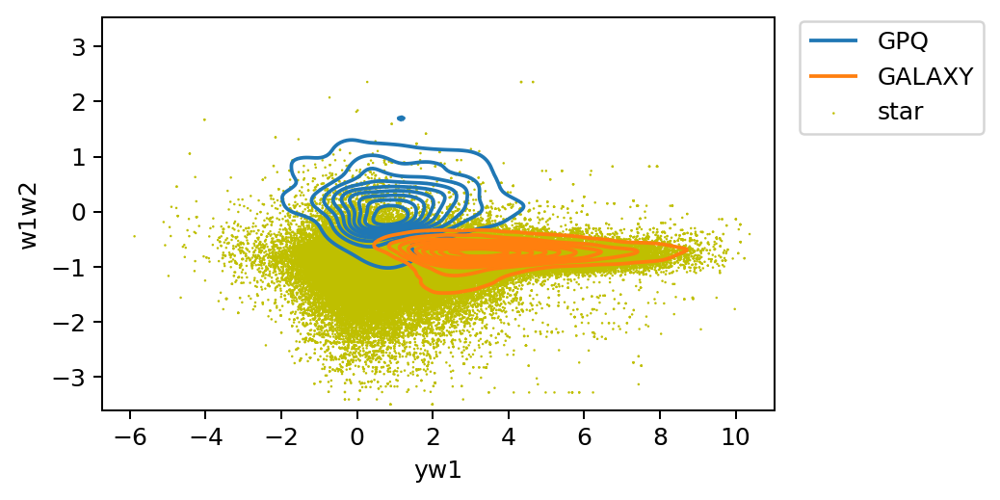

In [84]:
# plot kde density
fig, ax = plt.subplots()
sns.kdeplot(data=gpq_95, x="yw1", y="w1w2",label='GPQ')
sns.kdeplot(data=galaxy_95, x="yw1", y="w1w2", label='GALAXY')
ax.scatter(star_95['yw1'],star_95['w1w2'],
            c='y',s=1,edgecolor='none',label='star',)

ax.legend(bbox_to_anchor=(1.02, 1.02), loc='upper left')

/cargo/nhome/xingjian/.local/lib/python3.8/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/cargo/nhome/xingjian/.local/lib/python3.8/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)


Text(0.5, 1.0, 'kernel density plot')

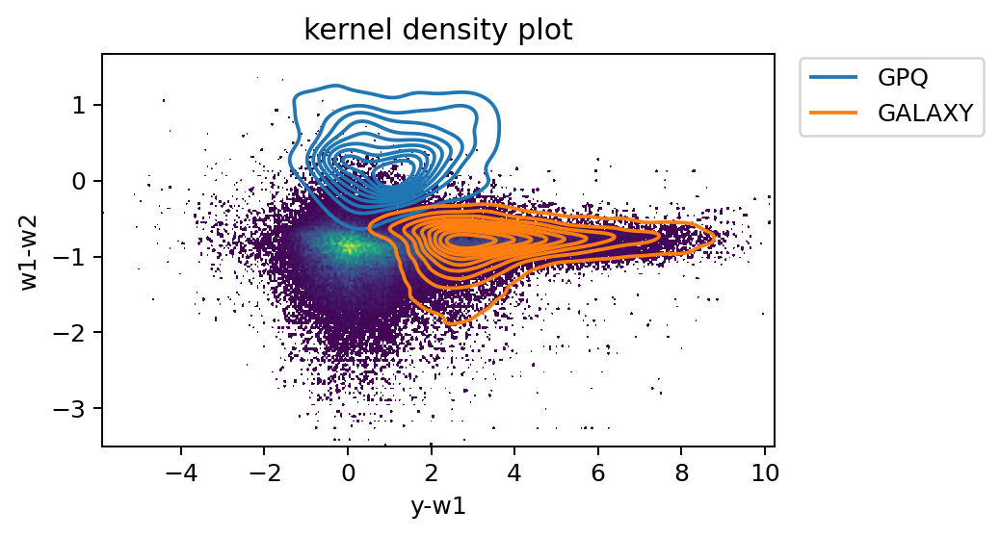

In [55]:
import mpl_scatter_density # adds projection='scatter_density'
from matplotlib.colors import LinearSegmentedColormap

# "Viridis-like" colormap with white background
white_viridis = LinearSegmentedColormap.from_list('white_viridis', [
    (0, '#ffffff'),
    (1e-20, '#440053'),
    (0.2, '#404388'),
    (0.4, '#2a788e'),
    (0.6, '#21a784'),
    (0.8, '#78d151'),
    (1, '#fde624'),
], N=256)


# plot kde density
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection='scatter_density')
sns.kdeplot(data=gpq_99, x="yw1", y="w1w2",label='GPQ')
sns.kdeplot(data=galaxy_99, x="yw1", y="w1w2", label='GALAXY')

ax.scatter_density(star_95['yw1'],star_95['w1w2'],
            cmap=white_viridis)
#fig.colorbar(density, label='Number of points per pixel')

ax.legend(bbox_to_anchor=(1.02, 1.02), loc='upper left')

plt.xlabel('y-w1')
plt.ylabel('w1-w2')
plt.title('kernel density plot')

/cargo/nhome/xingjian/.local/lib/python3.8/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/cargo/nhome/xingjian/.local/lib/python3.8/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)


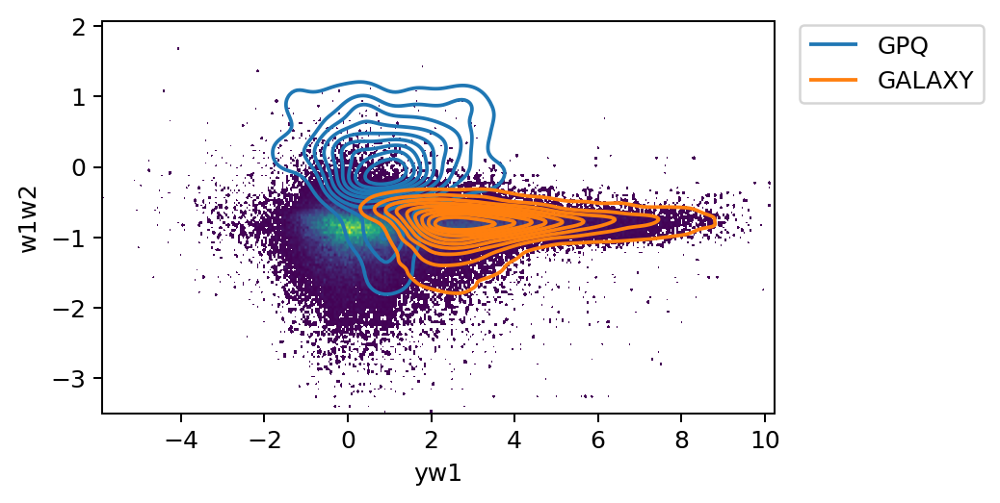

In [45]:
# import mpl_scatter_density # adds projection='scatter_density'
# from matplotlib.colors import LinearSegmentedColormap

# # "Viridis-like" colormap with white background
# white_viridis = LinearSegmentedColormap.from_list('white_viridis', [
#     (0, '#ffffff'),
#     (1e-20, '#440053'),
#     (0.2, '#404388'),
#     (0.4, '#2a788e'),
#     (0.6, '#21a784'),
#     (0.8, '#78d151'),
#     (1, '#fde624'),
# ], N=256)


# # plot kde density
# fig = plt.figure()
# ax = fig.add_subplot(1, 1, 1, projection='scatter_density')
# sns.kdeplot(data=gpq_99, x="yw1", y="w1w2",label='GPQ')
# sns.kdeplot(data=galaxy_99, x="yw1", y="w1w2", label='GALAXY')

# ax.scatter_density(star_95['yw1'],star_95['w1w2'],
#             cmap=white_viridis)
# #fig.colorbar(density, label='Number of points per pixel')

# ax.legend(bbox_to_anchor=(1.02, 1.02), loc='upper left')
